
## Import pyactigraphy library + basic libraries

This notebook is absolutely based on PyActigraphy, a package developed by Grégory Hammad (https://github.com/ghammad/pyActigraphy)


In [57]:
import pyActigraphy

In [58]:
import plotly.graph_objs as go

In [59]:
import pandas as pd
import numpy as np

___


## Import RAW file(s)

In [60]:
rawAWD = pyActigraphy.io.read_raw_awd('example_10.CSV')

___

## Raw File - Basic Features

In [61]:
rawAWD.start_time

Timestamp('2018-01-23 19:00:00')

In [62]:
rawAWD.frequency

Timedelta('0 days 00:01:00')

In [63]:
rawAWD.data

2018-01-23 19:00:00       0
2018-01-23 19:01:00    1994
2018-01-23 19:02:00    1976
2018-01-23 19:03:00      12
2018-01-23 19:04:00     573
                       ... 
2018-02-02 05:14:00      13
2018-02-02 05:15:00      48
2018-02-02 05:16:00      14
2018-02-02 05:17:00       5
2018-02-02 05:18:00       0
Freq: T, Length: 13579, dtype: int64

In [64]:
rawAWD.data.index

DatetimeIndex(['2018-01-23 19:00:00', '2018-01-23 19:01:00',
               '2018-01-23 19:02:00', '2018-01-23 19:03:00',
               '2018-01-23 19:04:00', '2018-01-23 19:05:00',
               '2018-01-23 19:06:00', '2018-01-23 19:07:00',
               '2018-01-23 19:08:00', '2018-01-23 19:09:00',
               ...
               '2018-02-02 05:09:00', '2018-02-02 05:10:00',
               '2018-02-02 05:11:00', '2018-02-02 05:12:00',
               '2018-02-02 05:13:00', '2018-02-02 05:14:00',
               '2018-02-02 05:15:00', '2018-02-02 05:16:00',
               '2018-02-02 05:17:00', '2018-02-02 05:18:00'],
              dtype='datetime64[ns]', length=13579, freq='T')

___

## Basic Raw Visualization and computation

In [65]:
rawAWD.data.sum()

41288250

In [66]:
rawAWD.data.mean()

3040.595772884601

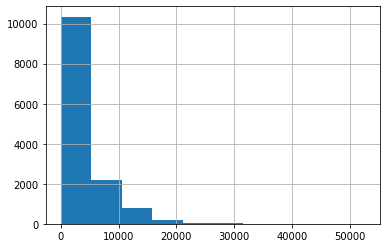

In [67]:
rawAWD.data.hist()

In [68]:
rawAWD.data.idxmax()

Timestamp('2018-01-31 19:43:00', freq='T')

In [69]:
rawAWD.data.idxmin()

Timestamp('2018-01-23 19:00:00', freq='T')

In [70]:
data = rawAWD.data

In [71]:
GT1000 = rawAWD.data[data > 1000] # values greater than 1000 or any specified value

In [72]:
GT1000index = rawAWD.data.index[data > 1000]

In [73]:
GT1000.sum() 

40518595

In [74]:
from plotly.graph_objs import Figure, FigureWidget, Layout, Scatter
from plotly.offline import init_notebook_mode, iplot

init_notebook_mode(connected=True)

In [75]:
layout = Layout(
    title="Raw Actimetry data",
    xaxis=dict(title="Date time"), 
    yaxis=dict(title="Activity/phase"), 
    showlegend=False
)

iplot(Figure(data=[Scatter(x=rawAWD.data.index, y=rawAWD.data)], layout=layout))

In [76]:
layout1 = Layout(
    title="Raw Actimetry values greater than 1000",
    xaxis=dict(title="Date time"), 
    yaxis=dict(title="Activity/phase"), 
    showlegend=False
)
iplot(Figure(data=[Scatter(x=GT1000index, y=GT1000, mode='markers',)], layout=layout1))

___

## Sleep-wake cycle inference

In [77]:
CK = rawAWD.CK()

In [78]:
np.savetxt("CK.csv", CK, delimiter=",")

In [79]:
layout = go.Layout(title="Rest/Activity detection",xaxis=dict(title="Date time"), yaxis=dict(title="Counts/period"), showlegend=False)

In [80]:
layout.update(yaxis2=dict(title='Classification',overlaying='y',side='right'), showlegend=True);

In [81]:
go.Figure(data=[
    go.Scatter(x=rawAWD.data.index.astype(str),y=rawAWD.data, name='Data'),
    go.Scatter(x=CK.index.astype(str),y=CK, yaxis='y2', name='CK')
], layout=layout)

In [82]:
crespo = rawAWD.Crespo()
crespo_6h = rawAWD.Crespo(alpha='6h')
crespo_zeta = rawAWD.Crespo(estimate_zeta=True)

In [83]:
go.Figure(data=[
    go.Scatter(x=rawAWD.data.index.astype(str),y=rawAWD.data, name='Data'),
    #go.Scatter(x=crespo.index.astype(str),y=crespo, yaxis='y2', name='Crespo'),
    #go.Scatter(x=crespo_6h.index.astype(str),y=crespo_6h, yaxis='y2', name='Crespo (6h)'),
    #go.Scatter(x=CK.index.astype(str),y=CK, yaxis='y2', name='CK'),
    go.Scatter(x=crespo_zeta.index.astype(str),y=crespo_zeta, yaxis='y2', name='Sleep')
], layout=layout)

___

## Activity Onset and Offset (data from sensor)

In [84]:
A_Onset = rawAWD.AonT(freq='10min', binarize=True)
A_Onset

Timedelta('0 days 05:10:00')

In [85]:
A_Offset = rawAWD.AoffT(freq='10min', binarize=True)
A_Offset

Timedelta('0 days 21:10:00')

___

## Basic Non-Parametric Variables

In [86]:
rawAWD.IS()

0.6669903091223752

In [87]:
rawAWD.IS(freq='30min', binarize=True, threshold=4)

0.5948817919181147

In [88]:
rawAWD.IS(freq='1H', binarize=False)

0.6417327242490838

In [89]:
rawAWD.IVm()

0.40841216212282

In [90]:
rawAWD.IV(freq='1H', binarize=False)

0.7134589684331468

In [91]:
rawAWD.IVm()

0.40841216212282

In [92]:
rawAWD.IV()

0.5781122600451601

In [93]:
rawAWD.IV(freq='1H', binarize=False)

0.7134589684331468

In [94]:
rawAWD.RA()

0.515196707131578

In [95]:
rawAWD.RA(binarize=False)

0.9133219652803318

In [96]:
rawAWD.M10()

0.9407407407407389

In [97]:
rawAWD.L5()

0.3009999999999893

___

## Specific Light non-parametric variables: M16 and M3 (dependencies: _lmx, average_daily_activity)

Used when light exposition data is loaded, instead of rest-activity data. M16 and M3

In [98]:
def _lmx(data, period, lowest=True):
    """Calculate the start time and mean activity of the period of
    lowest/highest activity"""

    avgdaily = _average_daily_activity(data, cyclic=True)

    n_epochs = int(pd.Timedelta(period)/avgdaily.index.freq)

    mean_activity = avgdaily.rolling(period).sum().shift(-n_epochs+1)

    if lowest:
        t_start = mean_activity.idxmin()
    else:
        t_start = mean_activity.idxmax()

    lmx = mean_activity[t_start]/n_epochs
    return t_start, lmx


In [99]:
def _average_daily_activity(data, cyclic=False):
    """Calculate the average daily activity distribution"""

    avgdaily = data.groupby([
        data.index.hour,
        data.index.minute,
        data.index.second
    ]).mean()

    if cyclic:
        avgdaily = pd.concat([avgdaily, avgdaily])
        index = pd.timedelta_range(
            start='0 day',
            end='2 days',
            freq=data.index.freq,
            closed='left'
        )
    else:
        index = pd.timedelta_range(
            start='0 day',
            end='2 day',
            freq=data.index.freq,
            closed='left'
        )

    avgdaily.index = index

    return avgdaily

In [100]:
def M16(self, binarize=True, threshold=4):
    if binarize is True:
            data = self.binarized_data(threshold)
    else:
            data = self.data

            _, M16 = _lmx(data, '16H', lowest=False)

    return M16



In [101]:
def M3(self, binarize=True, threshold=4):
    if binarize is True:
            data = self.binarized_data(threshold)
    else:
            data = self.data

            _, M16 = _lmx(data, '3H', lowest=False)

    return M16



In [102]:
M16(rawAWD, binarize=False, threshold=4)

4496.012754629634

In [103]:
M3(rawAWD, binarize=False, threshold=4)

6302.959259259249

___

## Non-Parametric phases (Low and Max)

In [104]:
data = rawAWD.data


In [105]:
L_onset = _lmx(data, 30, lowest=True)
L_onset


/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:16: RuntimeWarning:

divide by zero encountered in double_scalars



(Timedelta('0 days 03:58:00'), inf)

In [106]:
M_onset= _lmx(data, 30, lowest=False)
M_onset

/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:16: RuntimeWarning:

divide by zero encountered in double_scalars



(Timedelta('1 days 09:44:00'), inf)

___

## Total Sum - Activity 24h profile (observe the frequency, freq= in average daily activity) + Average daily Activity

In [107]:
Average = rawAWD.average_daily_activity(freq='60min', cyclic=False, binarize=True, threshold=4)
Average 
Average_Activity = np.sum(Average, axis=0)
Average_Activity

970.4777777777778

In [108]:
daily_profile = rawAWD.average_daily_activity(freq='60min', cyclic=True, binarize=True, threshold=4)

In [109]:
daily_profile.mean()

40.43657407407408

In [110]:
daily_profile.median()

46.238888888888894

In [111]:
from scipy import ndimage

In [112]:
ndimage.measurements.center_of_mass(daily_profile) # to calculate the center of gravity or centroid (/2 if 60_)

(24.80383087368192,)

In [113]:
ndimage.measurements.center_of_mass(daily_profile.index) # to calculate the center of gravity or centroid (/2 if 60_)

(31.666666666666668,)

In [114]:
daily_profile.sum() # 2x Lux, because of cyclic=True on daily profile calculation

1940.9555555555555

In [115]:
daily_profile.idxmax()

Timedelta('0 days 17:00:00')

In [116]:
daily_profile.idxmin()

Timedelta('0 days 03:00:00')

In [117]:
ProfileGTx = daily_profile[daily_profile>40] # have to specify the value (standard: > 1000 counts)

In [118]:
ProfileGTx.sum()

1415.7777777777778

In [119]:
ProfileGTx.mean()

54.452991452991455

In [120]:
ProfileGTx.idxmax()

Timedelta('0 days 17:00:00')

In [121]:
ProfileGTx.idxmin()

Timedelta('0 days 20:00:00')

In [122]:
ProfileGTxindex = ProfileGTx.index[ProfileGTx>40]

In [123]:
ProfileGTxindex 

TimedeltaIndex(['0 days 08:00:00', '0 days 09:00:00', '0 days 10:00:00',
                '0 days 11:00:00', '0 days 12:00:00', '0 days 13:00:00',
                '0 days 14:00:00', '0 days 15:00:00', '0 days 16:00:00',
                '0 days 17:00:00', '0 days 18:00:00', '0 days 19:00:00',
                '0 days 20:00:00', '1 days 08:00:00', '1 days 09:00:00',
                '1 days 10:00:00', '1 days 11:00:00', '1 days 12:00:00',
                '1 days 13:00:00', '1 days 14:00:00', '1 days 15:00:00',
                '1 days 16:00:00', '1 days 17:00:00', '1 days 18:00:00',
                '1 days 19:00:00', '1 days 20:00:00'],
               dtype='timedelta64[ns]', freq=None)

___

#### Average 24-h profile View (single or double plot, according to cyclic argument in daily_profile)

In [124]:
layout.update(title="24-h profile - Double plot",xaxis=dict(title="Time"), showlegend=False);


In [125]:
go.Figure(data=[
    go.Scatter(x=daily_profile.index.astype(str), y=daily_profile)
], layout=layout)

In [126]:
layout1 = Layout(
    title="24-h Profile with values greater than X ",
    xaxis=dict(title="Date time"), 
    yaxis=dict(title="Activity/phase"), 
    showlegend=False
    
)
iplot(Figure(data=[Scatter(x=ProfileGTxindex, y=ProfileGTx, mode='markers',)], layout=layout1))

___

## Total Counts (PyActigraphy Methods)

In [127]:
rawAWD.ADAT(binarize=True, threshold=4)

820.5454545454545

In [128]:
#rawAWD.ADATp(period='7D', binarize=True, threshold=4, verbose=False)
rawAWD.ADATp(period= '7D', binarize=True, threshold=4, verbose=True)

Number of periods: 1
 Time unaccounted for: 2 days, 10h, 18m, 0s


[844.0]

___

## Area Under the Curve (AUC) - 24-h Profile - Total

In [129]:
daily_profile1 = rawAWD.average_daily_activity(freq='60min', cyclic=True, binarize=True, threshold=4)
AUC_total = (np.trapz(daily_profile1, axis=0)/2)
AUC_total

960.7527777777777

___

## Area Under the Curve (AUC) - 24-h Profile - Partial (View + Calculation)

### 1. According to Sleep-wake cycle

In [130]:
Soff = 5 # example

In [131]:
Son = 21 # example

In [132]:
Soff2 = 29 # example, to compute sleep duration

In [133]:
df = pd.DataFrame(np.array(daily_profile), columns=['y'])
AUC_wake = np.trapz(df['y'][Soff:Son])
AUC_Sleep = np.trapz(df['y'][Son:Soff2])

In [134]:
AUC_wake

768.0277777777777

In [135]:
AUC_Sleep

142.4

In [136]:
from plotly.subplots import make_subplots
from plotly.graph_objs import Figure, FigureWidget, Layout, Scatter
from plotly.offline import init_notebook_mode, iplot
layout.update(title="Partial Activity profile - Wake",xaxis=dict(title="Time"), showlegend=False);


init_notebook_mode(connected=True)

In [137]:
go.Figure(data=[
    go.Scatter(x=daily_profile.index.astype(str), y = (df['y'][Soff:Son]))
], layout=layout)

In [138]:
layout.update(title="Partial Activity profile - Sleep",xaxis=dict(title="Time"), showlegend=False);

In [139]:
go.Figure(data=[
    go.Scatter(x=daily_profile.index.astype(str), y = (df['y'][Son:Soff2]))
], layout=layout)

### 2. According to natural LD Cycle (check Lat x Long)

In [140]:
daily_profile_luz = rawAWD.average_daily_activity(freq='60min', cyclic=True, binarize=True, threshold=4)

In [141]:
Lon = 6 # example of natural LD, sunrise = 6h, sunset = 18h

In [142]:
Loff = 18

In [143]:
Lon2 = 30

In [144]:
df2 = pd.DataFrame(np.array(daily_profile_luz), columns=['y'])
AUC_Day = np.trapz(df2['y'][Lon:Loff])
AUC_Night = np.trapz(df2['y'][Loff:Lon2])

In [145]:
AUC_Day

573.9444444444445

In [146]:
AUC_Night

309.2111111111111

In [147]:
from plotly.subplots import make_subplots
from plotly.graph_objs import Figure, FigureWidget, Layout, Scatter
from plotly.offline import init_notebook_mode, iplot
layout.update(title="Partial Activity profile - Day",xaxis=dict(title="Time"), showlegend=False);


init_notebook_mode(connected=True)

In [148]:
go.Figure(data=[
    go.Scatter(x=daily_profile.index.astype(str), y = (df2['y'][Lon:Loff]))

], layout=layout)

In [149]:
layout.update(title="Partial Activity profile - Night",xaxis=dict(title="Time"), showlegend=False);

go.Figure(data=[
    go.Scatter(x=daily_profile.index.astype(str), y = (df2['y'][Loff:Lon2]))

], layout=layout)

### 3. Count Activity from Sunset to Sleep Onset

In [150]:
AUC_Sunset_SleepOnset = np.trapz(df2['y'][Loff:Son])
AUC_Sunset_SleepOnset

106.7611111111111

In [151]:
layout.update(title="Partial Activity profile - Sunset to Sleep Onset",xaxis=dict(title="Time"), showlegend=False);
go.Figure(data=[
    go.Scatter(x=daily_profile.index.astype(str), y = (df2['y'][Loff:Son]))

], layout=layout)

__________

## Cosinor Analysis 

In [152]:
from pyActigraphy.analysis import Cosinor

In [153]:
cosinor = Cosinor()

In [154]:
import plotly.graph_objects as go

In [47]:
# raw = pyActigraphy.io.read_raw_awd('example_10.csv') to open a different file

In [155]:
raw = rawAWD

In [156]:
go.Figure(go.Scatter(x=raw.data.index.astype(str),y=raw.data))

In [157]:
results = cosinor.fit(raw, verbose=True) # Set verbose to True to print the fit output

[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 62
    # data points      = 13579
    # variables        = 4
    chi-square         = 2.7831e+11
    reduced chi-square = 20501606.2
    Akaike info crit   = 228620.231
    Bayesian info crit = 228650.296
[[Variables]]
    Amplitude:  785.056148 +/- 54.9669815 (7.00%) (init = 50)
    Acrophase:  2.57706946 +/- 0.14222682 (5.52%) (init = 3.141593)
    Period:     1710.15716 +/- 8.33411740 (0.49%) (init = 1440)
    Mesor:      3036.31235 +/- 38.9568763 (1.28%) (init = 50)
[[Correlations]] (unreported correlations are < 0.100)
    C(Acrophase, Period) =  0.871


In [158]:
results.params['Mesor'].value

3036.3123479495407

In [159]:
results.params['Acrophase'].value

2.5770694645684484

In [160]:
results.aic # Akaike information criterium

228620.23066849244

In [161]:
results.redchi # Reduced Chi^2 

20501606.15873739

In [162]:
best_fit = cosinor.best_fit(raw, results.params)

In [163]:
go.Figure(
    data=[
        go.Scatter(x=raw.data.index.astype(str),y=raw.data,name='Raw data'),
        go.Scatter(x=best_fit.index.astype(str),y=best_fit,name='Best fit')
    ]
)

_____

## Sleep fragmentation via state transition probability

In [167]:
layout = go.Layout(title="",xaxis=dict(title=""), showlegend=False)

In [174]:
pRA, pRA_weights = raw.pRA(0, start='00:00:00', period='8H')

In [175]:
layout.update(title="Rest->Activity transition probability",xaxis=dict(title="Time [min]"), showlegend=False);

In [176]:
go.Figure(data=go.Scatter(x=pRA.index, y=pRA, name='', mode = 'markers'), layout=layout)

In [177]:
raw.kRA(0)

0.194664576883644

In [178]:
raw.kRA(0, start='00:00:00', period='8H') # restricted to the specified time window

0.2162555824672158

In [196]:
raw.kRA(0, start='AoffT', freq='15min') # transition from activity to rest: How easy is to wake-up from sleep?
# Probability to wake-up

0.2036316351912333

In [180]:
raw.AoffT('15min'), raw.AonT('15min') 

(Timedelta('0 days 21:00:00'), Timedelta('0 days 06:00:00'))

In [181]:
raw.kRA(0, start='00:45:00', period='6h15min')

0.21445522879003762

In [189]:
raw.kAR(0)

0.06328465947483422

In [190]:
raw.kAR(0, start='AonT', freq='15min') # transition from rest to activity

0.019240697698080105

_________

## Log-transformated data

Important to run light exposition data instead of rest-activity

In [96]:
log10_value = np.log10(rawAWD.data)


/opt/anaconda3/lib/python3.7/site-packages/pandas/core/series.py:679: RuntimeWarning:

divide by zero encountered in log10



In [97]:
log10_value

2018-01-23 19:00:00        -inf
2018-01-23 19:01:00    3.299725
2018-01-23 19:02:00    3.295787
2018-01-23 19:03:00    1.079181
2018-01-23 19:04:00    2.758155
                         ...   
2018-02-02 05:14:00    1.113943
2018-02-02 05:15:00    1.681241
2018-02-02 05:16:00    1.146128
2018-02-02 05:17:00    0.698970
2018-02-02 05:18:00        -inf
Freq: T, Length: 13579, dtype: float64

In [100]:
layout = Layout(
    title="Raw Activity data",
    xaxis=dict(title="Date time"), 
    yaxis=dict(title="Activity/phase"), 
    showlegend=False
)

iplot(Figure(data=[Scatter(x=rawAWD.data.index, y=log10_value)], layout=layout))